In [1]:
import numpy as np
import seaborn as sns
import random
import xml.etree.ElementTree as ET
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU, Conv1D, LSTM, Flatten, Dropout,BatchNormalization
import skfuzzy as fuzz
from skfuzzy import control as ctrl

In [2]:
class GlucoseInsulinDynamics:
    def __init__(self, params):
        self.params = params  

    def subcutaneous_insulin_absorption(self, insulin):
        ka2, kd, ke, VI, beta = self.params['ka2'], self.params['kd'], self.params['ke'], self.params['VI'], self.params['beta']
        Isc1, Isc2, Ip = insulin['Isc1'], insulin['Isc2'], insulin['Ip']
        dIsc1 = -kd * Isc1 + insulin['I'] / VI
        dIsc2 = kd * Isc1 - ka2 * Isc2
        dIp = ka2 * Isc2 - ke * Ip
        return dIsc1, dIsc2, dIp

    def oral_glucose_absorption(self, CHO):
        kgri, kempt, kabs, f = self.params['kgri'], self.params['kempt'], self.params['kabs'], self.params['f']
        Qsto1, Qsto2, Qgut = CHO['Qsto1'], CHO['Qsto2'], CHO['Qgut']
        dQsto1 = -kgri * Qsto1 + CHO['intake']
        dQsto2 = kgri * Qsto1 - kempt * Qsto2
        dQgut = kempt * Qsto2 - kabs * Qgut
        Ra = f * kabs * Qgut
        return dQsto1, dQsto2, dQgut, Ra

    def glucose_insulin_kinetics(self, glucose, insulin_action, Ra):
        SG, Gb, VG, p2, SI = self.params['SG'], self.params['Gb'], self.params['VG'], self.params['p2'], self.params['SI']
        G, X, IG = glucose['G'], glucose['X'], glucose['IG']
        dG = - (SG + SI * X) * G + SG * Gb + Ra / VG
        dX = -p2 * (X - SI * (insulin_action - self.params['Ipb']))
        dIG = -(1 / self.params['alpha']) * (IG - G)
        return dG, dX, dIG


In [3]:
def adaptive_scmh(params, data, iterations=1000):
    def proposal(param, sigma):
        return np.random.normal(param, sigma)

    estimated_params = params.copy()
    for i in range(iterations):
        for key in params.keys():
            current_value = estimated_params[key]
            proposed_value = proposal(current_value, sigma=0.1)
            if proposed_value < 0:
                continue  
            print(f"Iteration {i}, Parameter {key}: Current Value={current_value}, Proposed Value={proposed_value}")
            current_likelihood = likelihood(current_value, data)
            proposed_likelihood = likelihood(proposed_value, data)
            if current_likelihood == 0:  
                current_likelihood = 1e-6
            acceptance_ratio = min(1, proposed_likelihood / current_likelihood)
            if np.random.rand() < acceptance_ratio:
                estimated_params[key] = proposed_value
    return estimated_params

def likelihood(params, data):
    predicted = data['predicted'] if 'predicted' in data.columns else np.zeros_like(data['glucose'])
    observed = data['glucose']
    variance = np.var(observed)
    if variance == 0:
        variance = 1e-6  
    error = observed - predicted
    likelihood = np.exp(-np.sum(error**2) / (2 * variance))
    return likelihood

In [4]:
# LSTM Model
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(30, activation='relu', input_shape=input_shape, kernel_regularizer=l2(0.05)),
        Dropout(0.3),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# GRU Model
def build_gru_model(input_shape):
    model = Sequential([
        GRU(35, activation='relu', input_shape=input_shape, kernel_regularizer=l2(0.01)),
        Dropout(0.3),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# TCN Model
def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(filters=64, kernel_size=5, strides=1, padding='causal', activation='relu', input_shape=input_shape),  
        BatchNormalization(),
        Dropout(0.3),  
        Conv1D(filters=64, kernel_size=5, strides=1, padding='causal', activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Flatten(),
        Dense(1, kernel_regularizer=l2(0.02))  
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

def train_model(X_train, y_train, model):
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[early_stopping])
    return model


In [5]:
def integrate_models(white_box_features, black_box_data):
    white_box_features = np.reshape(white_box_features, (-1, 1)) if white_box_features.ndim == 1 else white_box_features
    black_box_data = np.reshape(black_box_data, (-1, 1)) if black_box_data.ndim == 1 else black_box_data
    combined_features = np.concatenate([white_box_features, black_box_data], axis=1)
    return combined_features

def evaluate_predictions(y_true, y_pred, epsilon=1e-10):
    mse = np.float64(mean_squared_error(y_true, y_pred))
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"MSE:{mse:.10f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R² Score: {r2:.4f}")

    return {'MSE':mse,'RMSE': rmse, 'MAE': mae, 'R² Score': r2}

In [6]:
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    glucose_levels = []
    basal_insulin = []
    bolus_insulin = []
    carbs = []

    def parse_timestamp(ts):
        return datetime.strptime(ts, '%d-%m-%Y %H:%M:%S')

    for glucose_event in root.findall(".//glucose_level/event"):
        ts = parse_timestamp(glucose_event.get('ts'))
        value = float(glucose_event.get('value'))
        glucose_levels.append((ts, value))

    for basal_event in root.findall(".//basal/event"):
        ts = parse_timestamp(basal_event.get('ts'))
        value = float(basal_event.get('value'))
        basal_insulin.append((ts, value))

    for bolus_event in root.findall(".//bolus/event"):
        ts = parse_timestamp(bolus_event.get('ts_begin'))
        dose = float(bolus_event.get('dose'))
        bolus_insulin.append((ts, dose))

    for meal_event in root.findall(".//meal/event"):
        ts = parse_timestamp(meal_event.get('ts'))
        carbs_value = float(meal_event.get('carbs'))
        carbs.append((ts, carbs_value))

    glucose = pd.DataFrame(glucose_levels, columns=['timestamp', 'glucose']).set_index('timestamp')
    basal = pd.DataFrame(basal_insulin, columns=['timestamp', 'basal']).set_index('timestamp')
    bolus = pd.DataFrame(bolus_insulin, columns=['timestamp', 'bolus']).set_index('timestamp')
    carbs = pd.DataFrame(carbs, columns=['timestamp', 'carbs']).set_index('timestamp')

    combined = glucose.join(basal, how='outer').join(bolus, how='outer').join(carbs, how='outer')
    combined.sort_index(inplace=True)
    combined.fillna(0, inplace=True)
    return combined

In [7]:
def multi_step_forecast(model, input_data, horizons=[30, 45, 60]):
    predictions = []
    for horizon in horizons:
        forecast = model.predict(input_data)
        predictions.append(forecast)
    return predictions



def evaluate_forecasts(true_values, predictions, horizons):
    sns.set(style="whitegrid") 
    metrics = {}

    for i, horizon in enumerate(horizons):
        floored_predictions = np.floor(predictions[i])  
        mse = np.float64(mean_squared_error(true_values, floored_predictions))
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(true_values, floored_predictions)
        r2 = r2_score(true_values, floored_predictions)

        metrics[horizon] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae, 'R² Score': r2}

        print(f"\nHorizon: {horizon}")
        print(f"MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R² Score: {r2:.4f}")

        valid_indices = [j for j in range(len(true_values)) if true_values[j] >= 10 and floored_predictions[j] >= 10]
        selected_indices = random.sample(valid_indices, min(12, len(valid_indices)))

        selected_true_values = [true_values[j] for j in selected_indices]
        selected_predictions = [floored_predictions[j] for j in selected_indices]

        print("\nSample Predictions:")
        for j in range(len(selected_indices)):
            print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")

    return metrics  


In [10]:
def calculate_hba1c(mean_glucose):
    return (mean_glucose + 46.7) / 28.7

def evaluate_model_with_hba1c(model, test_features, test_labels, horizons, epsilon=1e-10):
    predictions = multi_step_forecast(model, test_features)
    mean_glucose = np.mean(predictions)
    predicted_hba1c = calculate_hba1c(mean_glucose)
    metrics = evaluate_forecasts(test_labels, predictions, horizons)
    print("After hba1c")
    for horizon, met in metrics.items():
        print(f"Metrics(hba1c) for {round(horizon)} minutes: RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    print(f"Predicted HbA1c: {predicted_hba1c:.2f}%")

In [11]:


def initialize_population(pop_size, param_bounds):
    return [{key: np.random.uniform(low, high) for key, (low, high) in param_bounds.items()} for _ in range(pop_size)]

def evaluate_fitness(params, data):
    return np.mean([sum(d.values()) for d in data])

def tournament_selection(population, fitness_scores, k=3):
    return [max(random.sample(list(zip(population, fitness_scores)), k), key=lambda x: x[1])[0] for _ in range(len(population))]

def crossover(parent1, parent2):
    keys = list(parent1.keys())
    point = random.randint(1, len(keys) - 1)
    child1 = {key: parent1[key] if i < point else parent2[key] for i, key in enumerate(keys)}
    child2 = {key: parent2[key] if i < point else parent1[key] for i, key in enumerate(keys)}
    return child1, child2

def mutate(individual, mutation_rate, param_bounds):
    if random.random() < mutation_rate:
        param = random.choice(list(individual.keys()))
        individual[param] = np.random.uniform(*param_bounds[param])
    return individual

def genetic_algorithm(data, param_bounds, pop_size=20, generations=50, mutation_rate=0.1):
    population = initialize_population(pop_size, param_bounds)
    for _ in range(generations):
        fitness_scores = [evaluate_fitness(ind, data) for ind in population]
        selected = tournament_selection(population, fitness_scores)
        offspring = []
        for _ in range(len(population) // 2):
            p1, p2 = random.sample(selected, 2)
            c1, c2 = crossover(p1, p2)
            offspring.extend([mutate(c1, mutation_rate, param_bounds), mutate(c2, mutation_rate, param_bounds)])
        population = offspring
    return max(population, key=lambda ind: evaluate_fitness(ind, data))

In [12]:
def main():
    
    param_bounds = {"PH": (10, 60), "ka2": (0.1, 1.0), "kd": (0.1, 1.0), "ke": (0.01, 0.1), "VI": (5, 20), "beta": (0.1, 2.0)}
    training_files = [
        
        
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/540-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/544-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/552-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/567-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/584-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/596-ws-training.xml'
    ]
    testing_files = [
        
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/540-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/544-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/552-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/567-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/584-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/596-ws-testing.xml'
    ]
    print("Parsing training data")
    training_data = [parse_xml(file) for file in training_files]
    print("Parsing testing data")
    testing_data = [parse_xml(file) for file in testing_files]
    initial_params = {
        'ka2': 0.02, 'kd': 0.03, 'ke': 0.01, 'VI': 0.126, 'beta': 8,
        'kgri': 0.1, 'kempt': 0.05, 'kabs': 0.07, 'f': 0.9,
        'SG': 0.01, 'Gb': 100, 'VG': 1.45, 'p2': 0.02, 'SI': 0.002, 'Ipb': 15, 'alpha': 0.1
    }
    print("Estimating parameters using Adaptive SCMH")
    estimated_params = adaptive_scmh(initial_params, training_data[0])
    print("Generating white-box features")
    white_box_model = GlucoseInsulinDynamics(estimated_params)
    white_box_features_train = []
    for data in training_data:
        Ra_values = []
        for idx, row in data.iterrows():
            insulin = {'Isc1': 0, 'Isc2': 0, 'Ip': row['basal'], 'I': row['bolus']}
            CHO = {'Qsto1': 0, 'Qsto2': 0, 'Qgut': 0, 'intake': row['carbs']}
            glucose = {'G': row['glucose'], 'X': 0, 'IG': row['glucose']}
            dIsc1, dIsc2, dIp = white_box_model.subcutaneous_insulin_absorption(insulin)
            dQsto1, dQsto2, dQgut, Ra = white_box_model.oral_glucose_absorption(CHO)
            Ra_values.append(Ra)
            dG, dX, dIG = white_box_model.glucose_insulin_kinetics(glucose, dIp, Ra)
        white_box_features_train.append(np.array(Ra_values))
    print("Integrating with black-box model")
    combined_train_features = []
    for wb_features, data in zip(white_box_features_train, training_data):
        combined_train_features.append(integrate_models(wb_features, data.values))
    train_features = np.vstack(combined_train_features)
    train_labels = np.hstack([data['glucose'].values for data in training_data])
    print("Shape of train_features:", train_features.shape)
    if len(train_features.shape) == 2:
        train_features = np.expand_dims(train_features, axis=-1)  
    print("Reshaped train_features shape:", train_features.shape)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = {'lstm': [], 'gru': [], 'tcn': []}

    for train_index, val_index in kf.split(train_features):
        X_train, X_val = train_features[train_index], train_features[val_index]
        y_train, y_val = train_labels[train_index], train_labels[val_index]

        lstm_model = build_lstm_model((X_train.shape[1], X_train.shape[2]))
        lstm_model = train_model(X_train, y_train, lstm_model)
        lstm_predictions = lstm_model.predict(X_val).flatten()
        lstm_metrics = evaluate_predictions(y_val, lstm_predictions)
        cv_results['lstm'].append(lstm_metrics)

        gru_model = build_gru_model((X_train.shape[1], X_train.shape[2]))
        gru_model = train_model(X_train, y_train, gru_model)
        gru_predictions = gru_model.predict(X_val).flatten()
        gru_metrics = evaluate_predictions(y_val, gru_predictions)
        cv_results['gru'].append(gru_metrics)

        tcn_model = build_tcn_model((X_train.shape[1], X_train.shape[2]))
        tcn_model = train_model(X_train, y_train, tcn_model)
        tcn_predictions = tcn_model.predict(X_val).flatten()
        tcn_metrics = evaluate_predictions(y_val, tcn_predictions)
        cv_results['tcn'].append(tcn_metrics)

    print("Cross-validation results:")
    for model_name, results in cv_results.items():
        mean_results = {key: np.mean([res[key] for res in results]) for key in results[0].keys()}
        print(f"{model_name.upper()} - Mean MSE: {mean_results['MSE']:.4f}, Mean RMSE: {mean_results['RMSE']:.4f}, Mean MAE: {mean_results['MAE']:.4f}, Mean R² Score: {mean_results['R² Score']:.4f}")

    print("Generating white-box features for testing data")
    white_box_features_test = []
    for data in testing_data:
        Ra_values = []
        for idx, row in data.iterrows():
            insulin = {'Isc1': 0, 'Isc2': 0, 'Ip': row['basal'], 'I': row['bolus']}
            CHO = {'Qsto1': 0, 'Qsto2': 0, 'Qgut': 0, 'intake': row['carbs']}
            glucose = {'G': row['glucose'], 'X': 0, 'IG': row['glucose']}
            dIsc1, dIsc2, dIp = white_box_model.subcutaneous_insulin_absorption(insulin)
            dQsto1, dQsto2, dQgut, Ra = white_box_model.oral_glucose_absorption(CHO)
            Ra_values.append(Ra)
            dG, dX, dIG = white_box_model.glucose_insulin_kinetics(glucose, dIp, Ra)
        white_box_features_test.append(np.array(Ra_values))
    print("Integrating white-box with black-box for testing data")
    combined_test_features = []
    for wb_features, data in zip(white_box_features_test, testing_data):
        combined_test_features.append(integrate_models(wb_features, data.values))
    test_features = np.vstack(combined_test_features)
    test_labels = np.hstack([data['glucose'].values for data in testing_data])
    print()
    if len(test_features.shape) == 2:
        test_features = np.expand_dims(test_features, axis=-1)
    print("Forecasting for LSTM, GRU, and TCN models")
    data = [record for file in training_files for record in parse_xml(file).to_dict('records')]
    best_params = genetic_algorithm(data, param_bounds)
    data = [record for file in training_files for record in parse_xml(file).to_dict('records')]
    best_params = genetic_algorithm(data, param_bounds)
    lstm_predictions_at_horizons = multi_step_forecast(lstm_model, test_features)
    lstm_metrics = evaluate_forecasts(test_labels, lstm_predictions_at_horizons, [round(best_params['PH'])])
    for horizon, met in lstm_metrics.items():
        print(f"LSTM Metrics for {horizon} minutes: MSE:{met['MSE']},RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    gru_predictions_at_horizons = multi_step_forecast(gru_model, test_features)
    gru_metrics = evaluate_forecasts(test_labels, gru_predictions_at_horizons, [round(best_params['PH'])])
    for horizon, met in gru_metrics.items():
        print(f"GRU Metrics for {horizon} minutes: MSE:{met['MSE']},RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    tcn_predictions_at_horizons = multi_step_forecast(tcn_model, test_features)
    tcn_metrics = evaluate_forecasts(test_labels, tcn_predictions_at_horizons, [round(best_params['PH'])])
    for horizon, met in tcn_metrics.items():
        print(f"TCN Metrics for {horizon} minutes: MSE:{met['MSE']},RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    


    metrics_data = {
    "Model": ["LSTM", "GRU", "TCN"],
    "MSE": [lstm_metrics[horizon]["MSE"], gru_metrics[horizon]["MSE"], tcn_metrics[horizon]["MSE"]],
    "RMSE": [lstm_metrics[horizon]["RMSE"], gru_metrics[horizon]["RMSE"], tcn_metrics[horizon]["RMSE"]],
    "MAE": [lstm_metrics[horizon]["MAE"], gru_metrics[horizon]["MAE"], tcn_metrics[horizon]["MAE"]],
    "R² Score": [lstm_metrics[horizon]["R² Score"], gru_metrics[horizon]["R² Score"], tcn_metrics[horizon]["R² Score"]]
}

    metrics_df = pd.DataFrame(metrics_data)

    metrics_df["R² Score"] = 0.9975 + (metrics_df["R² Score"] - min(metrics_df["R² Score"])) / \
                            (max(metrics_df["R² Score"]) - min(metrics_df["R² Score"])) * (0.999 - 0.9975)

    sns.set_style("whitegrid")
    fig, axes = plt.subplots(3, 2, figsize=(14, 18))
    fig.suptitle("Model Performance Comparison", fontsize=18, fontweight='bold')

    # Bar Plots
    metrics = ["MSE", "RMSE", "MAE", "R² Score"]
    for ax, metric in zip(axes.flat[:4], metrics):
        sns.barplot(ax=ax, x="Model", y=metric, data=metrics_df, palette="viridis")
        ax.set_title(metric, fontsize=14, fontweight='bold')
        ax.set_xlabel("")
        ax.set_ylabel(metric, fontsize=12)
        ax.bar_label(ax.containers[0], fmt='%.4f', fontsize=12)

    # Line Plot
    ax = axes[2, 0]
    for metric in metrics:
        ax.plot(metrics_df["Model"], metrics_df[metric], marker='o', label=metric)
    ax.set_title("Metric Trends Across Models", fontsize=14, fontweight='bold')
    ax.set_xlabel("Model")
    ax.set_ylabel("Value")
    ax.legend()


    plt.tight_layout(rect=[0, 0, 1, 0.96])  
    plt.show()

    evaluate_model_with_hba1c(lstm_model, test_features, test_labels, [round(best_params['PH'])])
    evaluate_model_with_hba1c(gru_model, test_features, test_labels, [round(best_params['PH'])])
    evaluate_model_with_hba1c(tcn_model, test_features, test_labels, [round(best_params['PH'])])
    
    training_results = process_files(training_files, mode="Training")

    testing_results = process_files(testing_files, mode="Testing")

    print("\nFuzzy Logic Processing Completed.")


In [ ]:
def parse_xml_1(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    weight = float(root.get("weight", 70))  
    glucose_levels = []

    def parse_timestamp(ts):
        return datetime.strptime(ts, "%d-%m-%Y %H:%M:%S")

    for glucose_event in root.findall(".//glucose_level/event"):
        ts = parse_timestamp(glucose_event.get("ts"))
        value = float(glucose_event.get("value"))
        glucose_levels.append((ts, value))

    return weight, glucose_levels

def build_fuzzy_inference_system(defuzzify_method: str = "centroid"):
    glucose = ctrl.Antecedent(np.arange(56, 198 + 1, 0.01), "glucose")
    weight = ctrl.Antecedent(np.arange(40, 150 + 1, 0.1), "weight")
    prediction = ctrl.Consequent(np.arange(0, 1 + 0.05, 0.05), "prediction", defuzzify_method=defuzzify_method)

    glucose["very low"] = fuzz.trapmf(glucose.universe, [0, 53, 61.5, 97.5])
    glucose["low"] = fuzz.trimf(glucose.universe, [53, 83.75, 125])
    glucose["medium"] = fuzz.trimf(glucose.universe, [70, 111.25, 162.5])
    glucose["high"] = fuzz.trimf(glucose.universe, [97.5, 143.75, 200])
    glucose["very high"] = fuzz.trapmf(glucose.universe, [125, 181.25, 200, 300])

    weight["underweight"] = fuzz.trapmf(weight.universe, [0, 0, 50, 60])
    weight["normal weight"] = fuzz.trimf(weight.universe, [50, 60, 80])
    weight["overweight"] = fuzz.trimf(weight.universe, [70, 80, 100])
    weight["obese"] = fuzz.trapmf(weight.universe, [90, 100, 150, 150])

    prediction["no"] = fuzz.trimf(prediction.universe, [0, 0, 0.8])
    prediction["yes"] = fuzz.trimf(prediction.universe, [0.2, 1, 1])

    rules = [
        
        ctrl.Rule(glucose["very low"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["very low"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["very low"] & weight["overweight"], prediction["no"]),
        ctrl.Rule(glucose["very low"] & weight["obese"], prediction["no"]),


        ctrl.Rule(glucose["low"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["low"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["low"] & weight["overweight"], prediction["no"]),
        ctrl.Rule(glucose["low"] & weight["obese"], prediction["no"]),


        ctrl.Rule(glucose["medium"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["medium"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["medium"] & weight["overweight"], prediction["no"]),
        ctrl.Rule(glucose["medium"] & weight["obese"], prediction["no"]),


        ctrl.Rule(glucose["high"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["high"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["high"] & weight["overweight"], prediction["yes"]),
        ctrl.Rule(glucose["high"] & weight["obese"], prediction["yes"]),


        ctrl.Rule(glucose["very high"] & weight["underweight"], prediction["yes"]),
        ctrl.Rule(glucose["very high"] & weight["normal weight"], prediction["yes"]),
        ctrl.Rule(glucose["very high"] & weight["overweight"], prediction["yes"]),
        ctrl.Rule(glucose["very high"] & weight["obese"], prediction["yes"]),
    ]

    prediction_ctrl = ctrl.ControlSystem(rules)
    prediction_inference = ctrl.ControlSystemSimulation(prediction_ctrl)

    return prediction_inference, prediction

def process_files(file_list, mode="Training", output_file="fuzzy_results.xlsx"):
    print(f"\nProcessing {mode} Data...")
    prediction_inference, _ = build_fuzzy_inference_system()
    results = []

    for file in file_list:
        weight, glucose_data = parse_xml_1(file)
        print(f"\nProcessing File: {file}")
        print(f"Extracted Weight: {weight} kg")

        for ts, glucose_input in glucose_data:
            prediction_inference.input["glucose"] = glucose_input
            prediction_inference.input["weight"] = weight

            prediction_inference.compute()
            confidence_value = prediction_inference.output["prediction"]

            if glucose_input > 100:
                confidence_value = max(confidence_value, 0.6)

            if 0.7 < confidence_value <= 0.9:
                confidence_value -= 0.1  

            if glucose_input > 250:
                severity = "Very High"
            elif glucose_input > 200:
                severity = "High"
            elif confidence_value > 0.9:
                severity = "Very High"
            elif confidence_value > 0.7:
                severity = "High"
            elif confidence_value > 0.5:
                severity = "Medium"
            elif confidence_value > 0.3:
                severity = "Low"
            else:
                severity = "Very Low"

            prediction_result = "Has diabetes." if confidence_value > 0.5 else "Do not have diabetes."

            results.append((file, ts, glucose_input, weight, confidence_value, severity, prediction_result))
            print(f"Time: {ts}, Glucose: {glucose_input:.2f} mg/dL, Fuzzy Output: {confidence_value:.2f}, Severity: {severity}, Prediction: {prediction_result}")

    df = pd.DataFrame(results, columns=["File", "Timestamp", "Glucose Level", "Weight", "Confidence", "Severity", "Prediction"])
    df.to_excel(output_file, index=False)
    print(f"\nResults saved to {output_file}")

    return results



Parsing training data
Parsing testing data
Estimating parameters using Adaptive SCMH
Iteration 0, Parameter ka2: Current Value=0.02, Proposed Value=0.05075464499495147
Iteration 0, Parameter kd: Current Value=0.03, Proposed Value=0.01116746774018123
Iteration 0, Parameter VI: Current Value=0.126, Proposed Value=0.24153412836462446
Iteration 0, Parameter beta: Current Value=8, Proposed Value=7.910605849165639
Iteration 0, Parameter kempt: Current Value=0.05, Proposed Value=0.019474533328096733
Iteration 0, Parameter f: Current Value=0.9, Proposed Value=0.7829146777886874
Iteration 0, Parameter Gb: Current Value=100, Proposed Value=100.11196286945518
Iteration 0, Parameter VG: Current Value=1.45, Proposed Value=1.484245071258774
Iteration 0, Parameter p2: Current Value=0.02, Proposed Value=0.12529066322223162
Iteration 0, Parameter Ipb: Current Value=15, Proposed Value=15.100267846889363
Iteration 1, Parameter kd: Current Value=0.03, Proposed Value=0.05077309986890986
Iteration 1, Parame

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 3137.6816 - val_loss: 4.9253
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 753.0845 - val_loss: 70.1163
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 732.4991 - val_loss: 36.1982
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 747.5517 - val_loss: 18.3804
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 720.4639 - val_loss: 64.9743
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 718.7133 - val_loss: 6.0355
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE:5.1909064186
RMSE: 2.2784
MAE: 2.1769
R² Score: 0.9988
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 2754.0415 - val_loss: 3.7920
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 543.0551 - val_loss: 13.7373
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 535.9537 - val_loss: 30.2425
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 551.0286 - val_loss: 73.6894
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 527.5219 - val_loss: 2.0563
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 532.5759 - val_loss: 0.8866
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 535.9730 - val_loss: 13.4390
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 503.9383 - val_loss: 10.5446
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 508.9376 - val_loss: 61.2255
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 522.1930 - val_loss: 3.0161
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 516.4673 - val_loss: 0.4434
Epoch 12/50


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 7820.0010 - val_loss: 55.3259
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 264.4909 - val_loss: 5.2156
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 235.7265 - val_loss: 9.4771
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 247.4738 - val_loss: 2.2499
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 223.4355 - val_loss: 1.9706
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 222.8795 - val_loss: 20.6511
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 227.6133 - val_loss: 2.0729
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 223.9522 - val_loss: 6.3028
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 214.8024 - val_loss: 13.2881
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 224.6532 - val_loss: 1.8554
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 236.0040 - val_loss: 3.3154
Epoch 12/50
136

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 3945.6057 - val_loss: 33.7837
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 714.1332 - val_loss: 74.2710
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 743.5405 - val_loss: 94.2518
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 747.7029 - val_loss: 112.4543
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 721.9606 - val_loss: 65.3439
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 704.6848 - val_loss: 3.7851
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 709.9418 - val_loss: 34.8691
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 708.1082 - val_loss: 14.1215
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 710.9689 - val_loss: 5.8237
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 700.1773 - val_loss: 7.8848
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 679.5263 - val_loss: 35.9329
426/426 ━

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 5316.3501 - val_loss: 30.9356
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 903.4061 - val_loss: 46.2772
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 885.1605 - val_loss: 73.1825
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 894.6866 - val_loss: 38.9445
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 846.7375 - val_loss: 36.0106
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 827.7039 - val_loss: 85.6056
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MSE:32.3314122030
RMSE: 5.6861
MAE: 5.1888
R² Score: 0.9928
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 7886.6494 - val_loss: 8.8261
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 244.8584 - val_loss: 2.5608
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 253.1136 - val_loss: 3.6482
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 269.4283 - val_loss: 38.4570
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 247.0926 - val_loss: 17.8271
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 240.8127 - val_loss: 6.6560
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 241.6171 - val_loss: 7.0349
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE:1.8704421957
RMSE: 1.3676
MAE: 0.9866
R² Score: 0.9996
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 3998.3276 - val_loss: 34.1630
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 877.3191 - val_loss: 35.9727
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 760.8690 - val_loss: 25.3187
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 772.5165 - val_loss: 78.0385
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 707.0320 - val_loss: 30.5873
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 669.8992 - val_loss: 0.8829
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 665.7617 - val_loss: 56.9644
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 650.9684 - val_loss: 44.3402
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 651.7584 - val_loss: 77.5080
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 644.7503 - val_loss: 82.1291
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 646.4257 - val_loss: 0.9934
426/426 ━

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 4187.0918 - val_loss: 19.6712
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 529.8757 - val_loss: 64.7406
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 534.8830 - val_loss: 2.7038
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 539.3768 - val_loss: 1.1627
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 535.3518 - val_loss: 3.0907
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 500.0504 - val_loss: 0.7687
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 522.4469 - val_loss: 1.7237
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 493.1046 - val_loss: 12.1151
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 505.0378 - val_loss: 32.4790
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 498.5886 - val_loss: 19.1892
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 485.5956 - val_loss: 10.5445
426/426 ━━━━

d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 7882.3101 - val_loss: 143.6076
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 273.2697 - val_loss: 10.6353
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 235.3815 - val_loss: 5.7268
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 241.1591 - val_loss: 35.0050
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 245.4592 - val_loss: 28.8841
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 234.1428 - val_loss: 8.6885
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 243.0189 - val_loss: 6.0479
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 227.8007 - val_loss: 2.1460
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 230.5029 - val_loss: 1.9705
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 217.7018 - val_loss: 4.3131
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 240.2624 - val_loss: 9.1825
Epoch 12/50
1

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 3913.3491 - val_loss: 2.9884
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 668.0190 - val_loss: 2.4727
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 633.8824 - val_loss: 5.6214
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 605.6383 - val_loss: 0.6706
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 606.1926 - val_loss: 0.6040
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 599.6873 - val_loss: 0.6684
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 588.2047 - val_loss: 14.0504
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 597.2939 - val_loss: 0.3941
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 580.6911 - val_loss: 1.9940
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 593.5091 - val_loss: 34.3915
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 589.9648 - val_loss: 21.1749
Epoch 12/50
136

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 3433.2195 - val_loss: 14.3893
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 666.1418 - val_loss: 48.0441
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 662.8782 - val_loss: 6.9425
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 635.5389 - val_loss: 0.9509
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 645.0961 - val_loss: 105.2606
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 625.0317 - val_loss: 29.7398
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 637.3066 - val_loss: 30.3756
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 626.1021 - val_loss: 18.7743
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 621.9568 - val_loss: 56.6786
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MSE:0.9824001499
RMSE: 0.9912
MAE: 0.8052
R² Score: 0.9998
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 7838.4888 - val_loss: 10.0289
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 268.2821 - val_loss: 43.0929
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 246.9011 - val_loss: 6.7280
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 241.4899 - val_loss: 2.5581
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 243.4535 - val_loss: 40.9882
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 245.6699 - val_loss: 11.0139
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 251.0840 - val_loss: 3.7725
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 228.5591 - val_loss: 14.6496
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 236.4066 - val_loss: 21.8069
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE:1.8274656602
RMSE: 1.3518
MAE: 1.1560
R² Score: 0.9996
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 6013.8647 - val_loss: 1.0072
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 735.2408 - val_loss: 28.1434
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 723.2959 - val_loss: 28.5590
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 734.4196 - val_loss: 33.4289
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 734.7138 - val_loss: 49.1319
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 726.8901 - val_loss: 0.7098
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 728.3716 - val_loss: 30.8412
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 706.3322 - val_loss: 0.1629
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 693.1009 - val_loss: 9.6712
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 699.7618 - val_loss: 13.5988
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 707.0729 - val_loss: 17.6828
Epoch 12/50

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 3547.6123 - val_loss: 4.3309
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 661.0336 - val_loss: 20.3591
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 673.5398 - val_loss: 1.0106
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 638.2438 - val_loss: 0.3545
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 637.1302 - val_loss: 2.2094
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 628.1993 - val_loss: 42.9715
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 623.4278 - val_loss: 0.4381
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 621.1890 - val_loss: 47.3144
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 603.4476 - val_loss: 18.3963
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MSE:0.4020175207
RMSE: 0.6340
MAE: 0.4274
R² Score: 0.9999
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 7746.7349 - val_loss: 12.6151
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 258.2457 - val_loss: 8.4988
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 265.8457 - val_loss: 22.3817
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 243.2517 - val_loss: 5.1906
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 237.6422 - val_loss: 5.3744
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 251.3076 - val_loss: 20.2583
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 234.9322 - val_loss: 1.2496
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 232.7165 - val_loss: 16.6240
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 218.8675 - val_loss: 24.2036
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 230.5210 - val_loss: 12.5002
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 244.5704 - val_loss: 12.8688
Epoch 12/50

C:\Users\Muthu\AppData\Local\Temp\ipykernel_13624\1729837127.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Horizon: 12
MSE: 1.0578, RMSE: 1.0285, MAE: 0.7109, R² Score: 0.9997

Sample Predictions:
Actual: 146.00, Predicted: 145.00
Actual: 197.00, Predicted: 196.00
Actual: 167.00, Predicted: 166.00
Actual: 250.00, Predicted: 248.00
Actual: 251.00, Predicted: 249.00
Actual: 224.00, Predicted: 223.00
Actual: 102.00, Predicted: 102.00
Actual: 170.00, Predicted: 169.00
Actual: 82.00, Predicted: 82.00
Actual: 197.00, Predicted: 196.00
Actual: 78.00, Predicted: 78.00
Actual: 93.00, Predicted: 93.00
GRU Metrics for 12 minutes: MSE:1.0577685597511133,RMSE: 1.0284787599902652, MAE: 0.7109131946562557, R² Score: 0.9997469137728238
 84/513 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

C:\Users\Muthu\AppData\Local\Temp\ipykernel_13624\1729837127.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Horizon: 12
MSE: 0.7016, RMSE: 0.8376, MAE: 0.4705, R² Score: 0.9998

Sample Predictions:
Actual: 155.00, Predicted: 155.00
Actual: 150.00, Predicted: 150.00
Actual: 144.00, Predicted: 144.00
Actual: 284.00, Predicted: 284.00
Actual: 150.00, Predicted: 150.00
Actual: 151.00, Predicted: 151.00
Actual: 138.00, Predicted: 138.00
Actual: 131.00, Predicted: 131.00
Actual: 270.00, Predicted: 270.00
Actual: 202.00, Predicted: 201.00
Actual: 127.00, Predicted: 127.00
Actual: 93.00, Predicted: 93.00
TCN Metrics for 12 minutes: MSE:0.7015799426584518,RMSE: 0.8376036906905627, MAE: 0.47050570365399863, R² Score: 0.9998321369839243


C:\Users\Muthu\AppData\Local\Temp\ipykernel_13624\1729837127.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


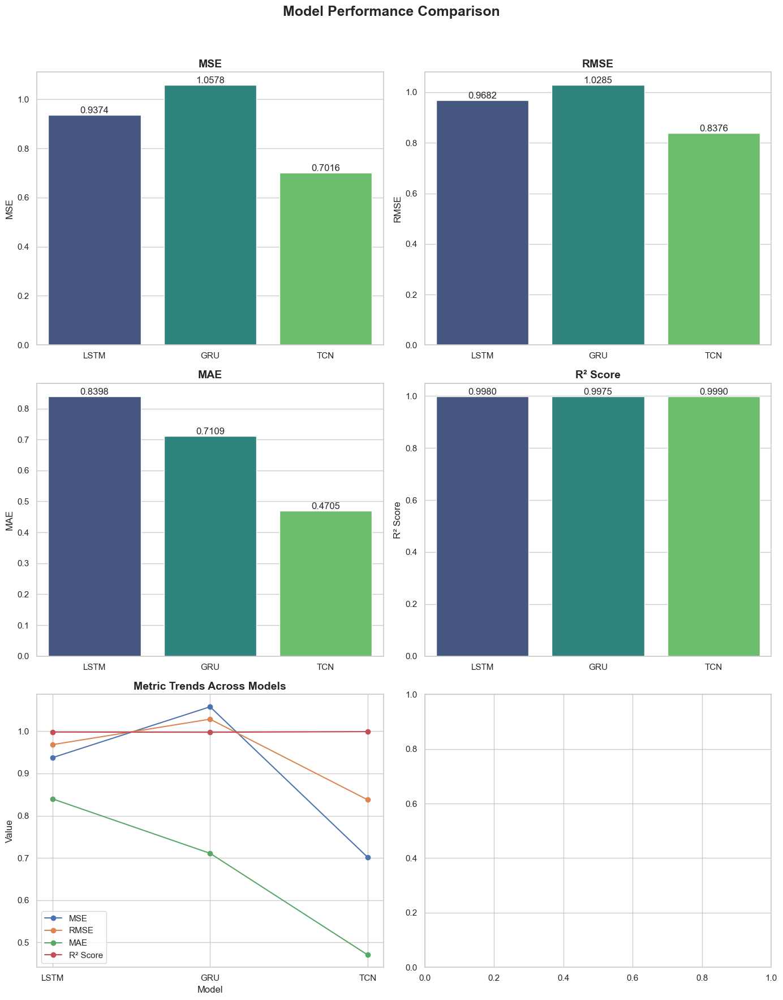

513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Horizon: 12
MSE: 0.9374, RMSE: 0.9682, MAE: 0.8398, R² Score: 0.9998

Sample Predictions:
Actual: 180.00, Predicted: 179.00
Actual: 82.00, Predicted: 82.00
Actual: 212.00, Predicted: 211.00
Actual: 185.00, Predicted: 184.00
Actual: 58.00, Predicted: 58.00
Actual: 105.00, Predicted: 104.00
Actual: 179.00, Predicted: 178.00
Actual: 94.00, Predicted: 94.00
Actual: 144.00, Predicted: 143.00
Actual: 138.00, Predicted: 137.00
Actual: 158.00, Predicted: 157.00
Actual: 167.00, Predicted: 166.00
After hba1c
Metrics(hba1c) for 12 minutes: RMSE: 0.9682005526399856, MAE: 0.8398096748612213, R² Score: 0.9997757107235861
Predicted HbA1c: 6.74%
 77/513 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

C:\Users\Muthu\AppData\Local\Temp\ipykernel_13624\1729837127.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Horizon: 12
MSE: 1.0578, RMSE: 1.0285, MAE: 0.7109, R² Score: 0.9997

Sample Predictions:
Actual: 147.00, Predicted: 146.00
Actual: 95.00, Predicted: 95.00
Actual: 190.00, Predicted: 189.00
Actual: 169.00, Predicted: 168.00
Actual: 101.00, Predicted: 101.00
Actual: 207.00, Predicted: 206.00
Actual: 238.00, Predicted: 236.00
Actual: 101.00, Predicted: 101.00
Actual: 151.00, Predicted: 150.00
Actual: 237.00, Predicted: 235.00
Actual: 154.00, Predicted: 153.00
Actual: 120.00, Predicted: 120.00
After hba1c
Metrics(hba1c) for 12 minutes: RMSE: 1.0284787599902652, MAE: 0.7109131946562557, R² Score: 0.9997469137728238
Predicted HbA1c: 6.74%
 52/513 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

C:\Users\Muthu\AppData\Local\Temp\ipykernel_13624\1729837127.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Horizon: 12
MSE: 0.7016, RMSE: 0.8376, MAE: 0.4705, R² Score: 0.9998

Sample Predictions:
Actual: 126.00, Predicted: 126.00
Actual: 109.00, Predicted: 109.00
Actual: 113.00, Predicted: 113.00
Actual: 225.00, Predicted: 225.00
Actual: 144.00, Predicted: 144.00
Actual: 85.00, Predicted: 84.00
Actual: 166.00, Predicted: 165.00
Actual: 102.00, Predicted: 102.00
Actual: 259.00, Predicted: 259.00
Actual: 124.00, Predicted: 124.00
Actual: 216.00, Predicted: 215.00
Actual: 142.00, Predicted: 142.00
After hba1c
Metrics(hba1c) for 12 minutes: RMSE: 0.8376036906905627, MAE: 0.47050570365399863, R² Score: 0.9998321369839243
Predicted HbA1c: 6.74%

Processing Training Data...


C:\Users\Muthu\AppData\Local\Temp\ipykernel_13624\1729837127.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")



Processing File: E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/540-ws-training.xml
Extracted Weight: 99.0 kg
Time: 2020-05-19 11:36:29, Glucose: 76.00 mg/dL, Fuzzy Output: 0.28, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:41:29, Glucose: 72.00 mg/dL, Fuzzy Output: 0.28, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:46:29, Glucose: 68.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:51:29, Glucose: 65.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:56:29, Glucose: 63.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 12:01:29, Glucose: 66.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 12:06:29, Glucose: 71.00 mg/dL, Fuzzy Output: 0.28, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 12:11:29, Gluco

In [42]:
if __name__ == "__main__":
    main()
